# Cell and zone summary description plots

**Pinned Environment:** [`conda_envs/space2_20250604.yml`](../conda_envs/space2_20250604.yml)

In [19]:
from pathlib import Path
import sys
import os
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import anndata
import scanpy as sc
import squidpy as sq

import pickle
import joblib

In [20]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [21]:
warnings.simplefilter(action='ignore', category=Warning)

## Local file info


In [22]:
sys.path.append(str(Path.cwd().resolve().parents[0]))

from config.paths import BASE_OUTDIR, INPUTS_DIR, FUNCTIONS_DIR

inputs_dir = INPUTS_DIR
structures_dir = os.path.join(BASE_OUTDIR, "structures")
merged_labels_dir = os.path.join(BASE_OUTDIR, "merge_labels")
labels_dir = os.path.join(BASE_OUTDIR, "cell_labeling/ouputs_mouselung_hurskainen_ref_consolidate_labels_xenseg_HDM")

plot_out_dir = os.path.join(BASE_OUTDIR, 'object_summary')

if not os.path.exists(plot_out_dir):
    os.makedirs(plot_out_dir)

In [23]:
import importlib
if str(FUNCTIONS_DIR) not in sys.path:
    sys.path.append(str(FUNCTIONS_DIR))

# import plotting functions as pu
import plotting_utils as pu

In [24]:
importlib.reload(pu)

<module 'plotting_utils' from '/home/workspace/spatial_tls_manuscript/utils/plotting_utils.py'>

## Load adata

In [25]:
# adata saved in 07_identify_structures.ipynb
adata = sc.read_h5ad(os.path.join(structures_dir,'adata_labeled_zones_structures.h5ad'))

# adata cd4 with cite/xen integrated umap
adata_cd4 = sc.read_h5ad(os.path.join(merged_labels_dir,'adata_labeled_cd4.h5ad'))

# adata cd4 int - CD4 adata including the CITE cells
adata_int = sc.read_h5ad(os.path.join(merged_labels_dir,'adata_cd4_int.h5ad'))

# Load xenium and reference adata objects for visualizing scanvi embedding with xenium and reference
adata_concat = sc.read_h5ad(os.path.join(labels_dir, 'adata_concat_scanvi.h5ad'))


In [52]:
# map zones to adata_cd4
adata_cd4.obs['zone_consol'] = adata_cd4.obs_names.map(adata.obs['zone_consol'])

## Load cell type and zone palettes

In [53]:
with open(os.path.join(inputs_dir, 'palettes/20250519_celltype_palette_mapped.pkl'), 'rb') as f:
    celltype_palette_mapped = pickle.load(f)

with open(os.path.join(inputs_dir, 'palettes/20250520_celltype_palette_coarse_mapped.pkl'), 'rb') as f:
    celltype_palette_coarse_mapped = pickle.load(f)

with open(os.path.join(inputs_dir, 'palettes/20250520_celltype_palette_coarser_mapped.pkl'), 'rb') as f:
    celltype_palette_coarser_mapped = pickle.load(f)

with open(os.path.join(inputs_dir, 'palettes/20250521_zone_consol_palette_mapped.pkl'), 'rb') as f:
    zone_consol_palette_mapped = pickle.load(f)

## Output annotations for Xenium Explorer

In [27]:
adata_day3 = adata[adata.obs['sample_label']=='HDM_day3', :]

# Create DataFrame with cleaned cell IDs
output_df = pd.DataFrame({
    'cell_id': [cell.split('_')[0] for cell in adata_day3.obs_names],
    'group': adata_day3.obs['label_fine'].values
})

# Save to CSV
output_df.to_csv(
    os.path.join(plot_out_dir, '20250917_HDM_day3_label_fine_for-xen-exp.csv'),
    index=False
)

## Summary plots

In [28]:
# update obsm, obs in reference/xenium object
adata_concat.obsm['X_umap_scanvi_refalign'] = adata_concat.obsm['X_umap']
adata_concat.obs['label_scanvi'] = adata_concat.obs['C_scANVI']
adata_concat.obs['label_scanvi'] = adata_concat.obs['label_scanvi'].astype('category')
adata_concat.obs['label_scanvi'] = adata_concat.obs['label_scanvi'].astype('category')

adata_concat.obs['sample_label'] = adata_concat.obs['sample_label'].astype(str)
adata_concat.obs.loc[adata_concat.obs['sample']=='hurskainen_ref', "sample_label"] = 'reference'
adata_concat.obs['sample_label'] = adata_concat.obs['sample_label'].astype('category')

In [29]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

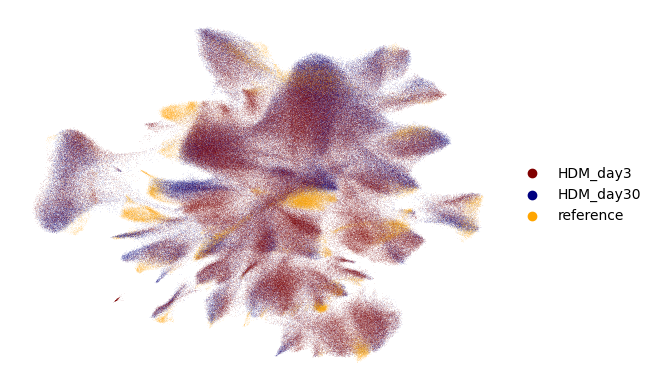

In [30]:
sample_ref_palette_mapped = {
    'HDM_day3': 'maroon',
 'HDM_day30': 'navy',
    'reference': 'orange'
}
sc.pl.embedding(adata_concat, basis = 'X_umap', color='sample_label', title = '', palette = sample_ref_palette_mapped, frameon=False, show=False)
plt.savefig(os.path.join(plot_out_dir, "scanvi_umap_samples_ref.png"), dpi=300, bbox_inches='tight', transparent=True)

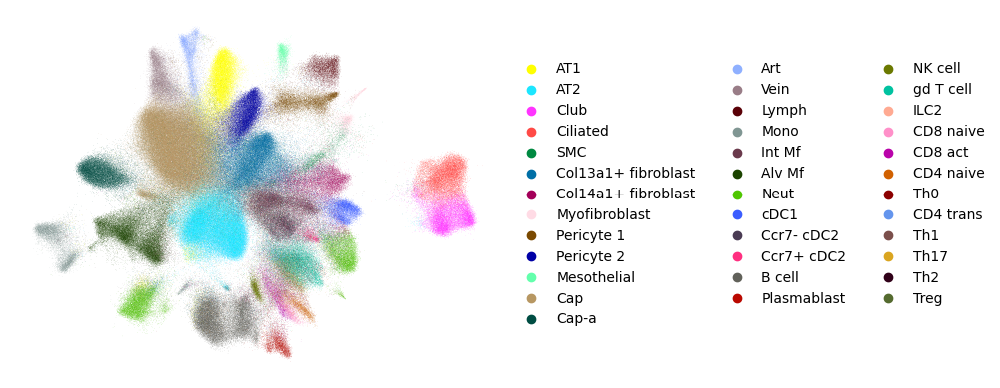

In [31]:
sc.pl.embedding(adata, basis = 'X_umap_scvi_refalign', color='label_fine', palette = celltype_palette_mapped, title = '', frameon=False, show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_label_fine.png"), dpi=300, bbox_inches='tight', transparent=True)

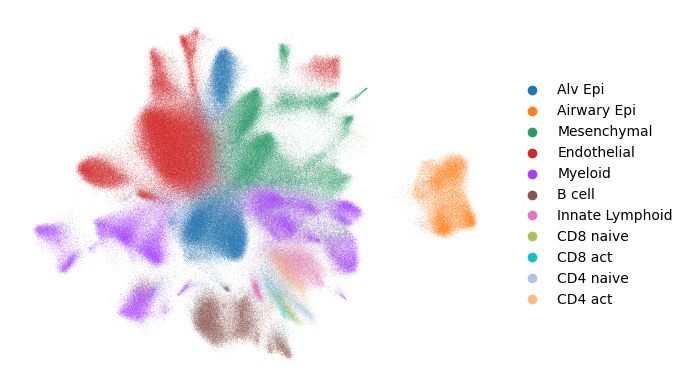

In [32]:
sc.pl.embedding(adata, basis = 'X_umap_scvi_refalign', color='label_medium', title = '', frameon=False, show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_label_medium.png"), dpi=300, bbox_inches='tight', transparent=True)

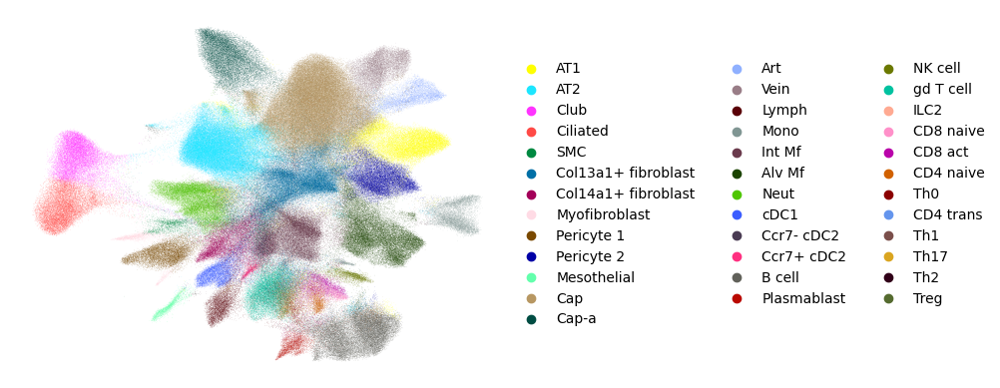

In [33]:
sc.pl.embedding(adata, basis = 'X_umap', color='label_fine', palette = celltype_palette_mapped, title = '', frameon=False, show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_scanvi_label_fine.pdf"), dpi=300, bbox_inches='tight', transparent=True)

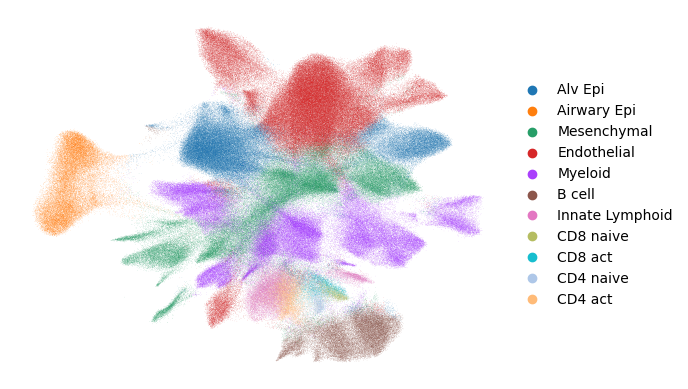

In [34]:
sc.pl.embedding(adata, basis = 'X_umap', color='label_medium', title = '', frameon=False, show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_scanvi_label_medium.png"), dpi=300, bbox_inches='tight', transparent=True)

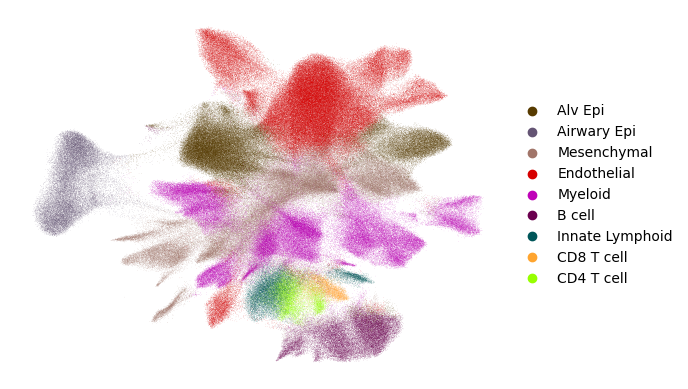

In [35]:
sc.pl.embedding(adata, basis = 'X_umap', color='label_coarse', title = '', palette = celltype_palette_coarse_mapped, frameon=False, show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_scanvi_label_coarse.pdf"), dpi=300, bbox_inches='tight', transparent=True)

#### Cell label markers

In [36]:
sc.tl.rank_genes_groups(adata, groupby='label_fine',  method='wilcoxon')

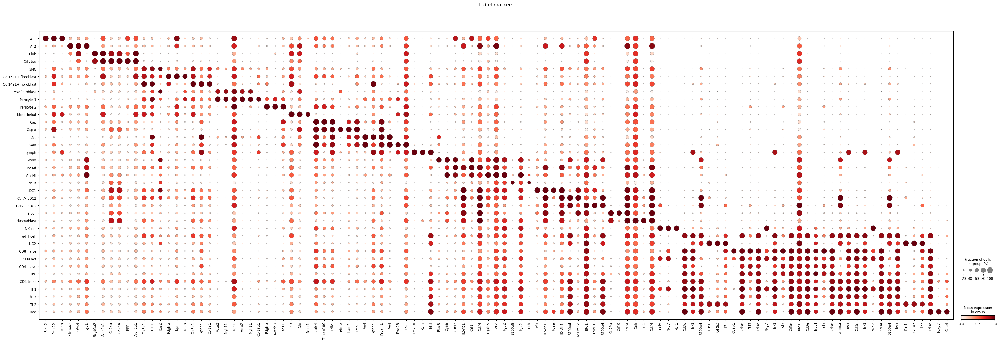

In [37]:
# Extract top marker genes for each cell type
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(3)

# Flatten the DataFrame into a list, preserving order: top genes for each group sequentially
ordered_genes = top_markers.T.values.flatten().tolist()

# Plot dotplot for adata_concat_ref
sc.pl.dotplot(
    adata,
    var_names=ordered_genes,  
    groupby='label_fine',
    standard_scale='var',  
    dendrogram=False,       
    title= 'Label markers',
    show=False
)
plt.savefig(os.path.join(plot_out_dir, "cell_label_dotplot.png"), dpi=300, bbox_inches='tight', transparent=True)

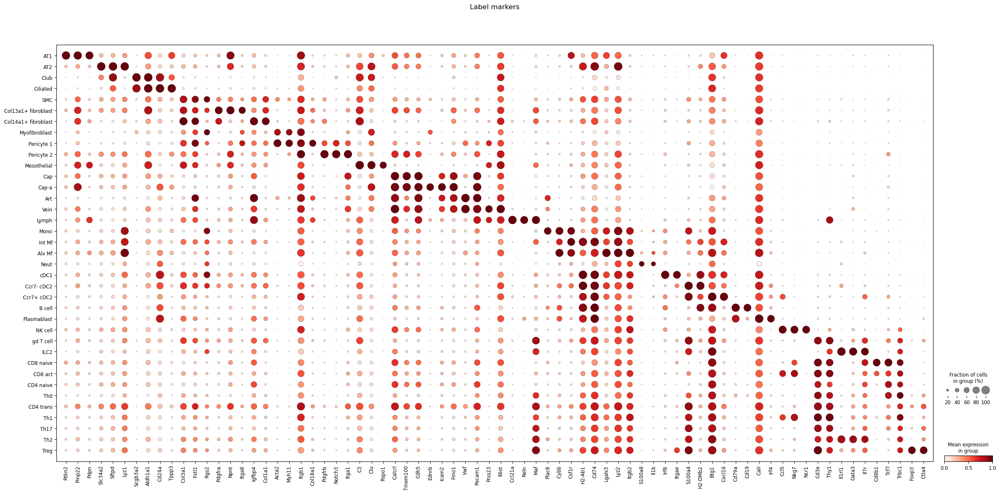

In [38]:
# Extract top marker genes for each cell type
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(3)

# Flatten the DataFrame into a list, preserving order: top genes for each group sequentially
# unique markers (remove duplicates)
ordered_genes = list(dict.fromkeys(top_markers.T.values.flatten().tolist()))

# Plot dotplot for adata_concat_ref
sc.pl.dotplot(
    adata,
    var_names=ordered_genes,  
    groupby='label_fine',
    standard_scale='var',  
    dendrogram=False,       
    title= 'Label markers',
    show=False
)
plt.savefig(os.path.join(plot_out_dir, "cell_label_dotplot_unique_markers.png"), dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(os.path.join(plot_out_dir, "cell_label_dotplot_unique_markers.pdf"), dpi=300, bbox_inches='tight', transparent=True)

### Composite plot

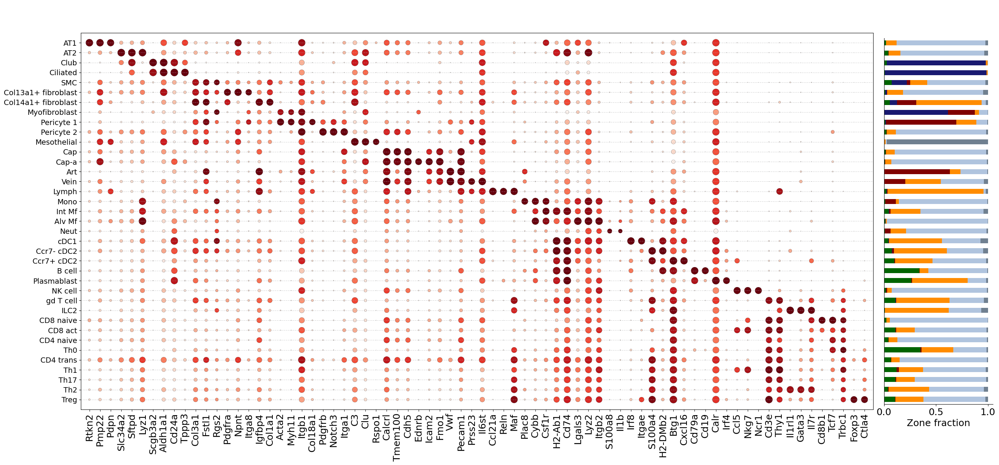

In [39]:
# Extract top marker genes for each cell type
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(3)

# Flatten the DataFrame into a list, preserving order: top genes for each group sequentially
# unique markers (remove duplicates)
ordered_genes = list(dict.fromkeys(top_markers.T.values.flatten().tolist()))

# Step 2: Compute fraction of each cell type across `zone_consol`
# This gives a count table
counts = (
    adata.obs
    .groupby(['label_fine', 'zone_consol'])
    .size()
    .unstack(fill_value=0)
)

# Convert to row-wise fractions
fractions = counts.div(counts.sum(axis=1), axis=0)

# Match the order of dotplot groups
group_order = adata.obs['label_fine'].cat.categories
fractions = fractions.loc[group_order]


# Step 1: Create DotPlot object
dotplot_obj = sc.pl.dotplot(
    adata,
    var_names=ordered_genes,
    groupby='label_fine',
    standard_scale='var', 
    dendrogram=False,
    return_fig=True,
    show=False
)

# Step 2: Draw the dotplot (required before axes exist)
dotplot_obj.make_figure()

# Increase font sizes in dotplot
dot_ax = dotplot_obj.get_axes()['mainplot_ax']
dot_ax.tick_params(labelsize=14)  # Y-axis cell type labels
dot_ax.set_title(dot_ax.get_title(), fontsize=18)
dot_ax.grid(True, axis='y', linestyle='--', alpha=0.5)

# Increase font sizes for gene labels (X-axis)
for label in dot_ax.get_xticklabels():
    label.set_fontsize(18)

for legend_key in ['color_legend_ax', 'size_legend_ax']:
    ax = dotplot_obj.get_axes().get(legend_key)
    if ax:
        ax.remove()

# Step 3: Get the axis position of the dotplot's data area
dot_ax = dotplot_obj.get_axes()['mainplot_ax']  # This is the core dotplot axis
dot_bbox = dot_ax.get_position()
fig = dot_ax.figure



# Step 4: Create a new barplot manually, aligned vertically
barplot_width = 0.1
barplot_horiz_offset = 0.01
ax1 = fig.add_axes([
    dot_bbox.x1 + 0.01, # barplot to right of dotplot
    dot_bbox.y0 + 0.01, # barplot just above dotplot 
    barplot_width,
    dot_bbox.height -0.02 # barplot height - adjust to align rows with dotplot
])

# Step 5: Plot barplot using aligned axis
fractions.plot(
    kind='barh',
    stacked=True,
    ax=ax1,
    color=[zone_consol_palette_mapped[z] for z in fractions.columns],
    legend=False
)

# Step 7: Clean up barplot appearance
ax1.set_ylabel('')
ax1.set_xlabel('Zone fraction')
ax1.invert_yaxis()
ax1.set_yticks([])  # Hide tick labels to avoid duplication
sns.despine(ax=ax1)
ax1.set_xlabel('Zone fraction', fontsize=18)
ax1.tick_params(labelsize=18)
# plt.show()

plt.savefig(os.path.join(plot_out_dir, "cell_label_dotplot_zone_fractions_nolegend.png"), dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(os.path.join(plot_out_dir, "cell_label_dotplot_zone_fractions_nolegend.pdf"), dpi=300, bbox_inches='tight', transparent=True)

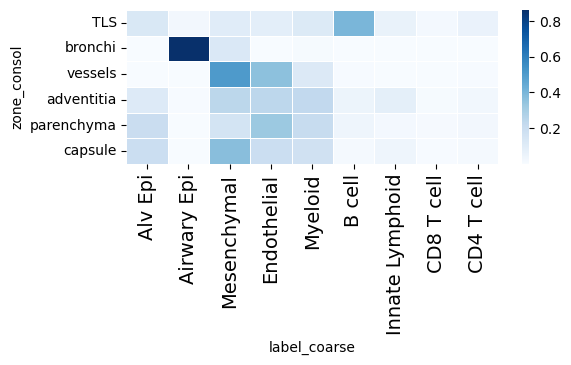

In [40]:
df_row_scale = pu.zone_composition_heatmap_2(adata, 'label_coarse', 'zone_consol',  scale_by='rows', swap_axes = False, 
                              save_path =os.path.join(plot_out_dir, "zone_comp_heatmap_label_coarse_scalerows.pdf") )

swap


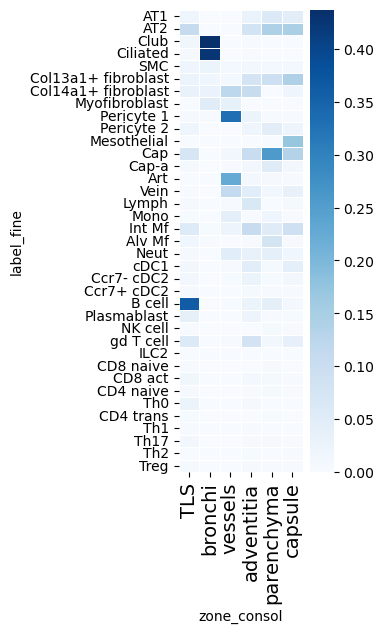

In [41]:
df = pu.zone_composition_heatmap_2(adata, 'label_fine', 'zone_consol', swap_axes = True, 
                              save_path =os.path.join(plot_out_dir, "zone_comp_heatmap_label_fine.png") )

## Spatial plots

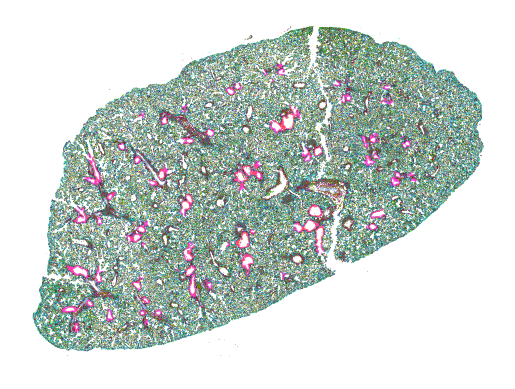

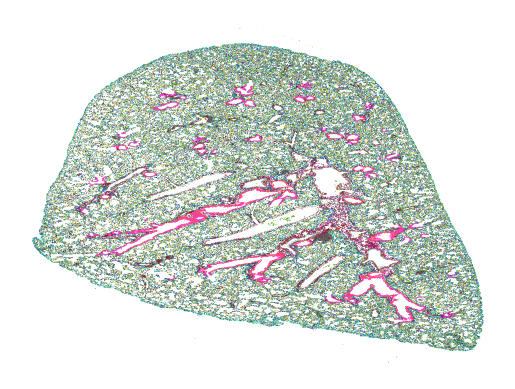

In [42]:
for timepoint in adata.obs['timepoint'].cat.categories:
    adata_sample = adata[adata.obs['timepoint']==timepoint, :]

    sc.pl.embedding(adata_sample, basis='spatial', color='label_fine', 
                    palette=celltype_palette_mapped, 
                    # title=sample_label, 
                    title = '',
                    frameon=False, 
                    size=1, 
                    legend_loc = 'none',
                   show = False)
    plt.savefig(os.path.join(plot_out_dir, f"{timepoint}_celltype_spatial_remove-title-legend.png"), dpi=300, bbox_inches='tight', transparent=True)

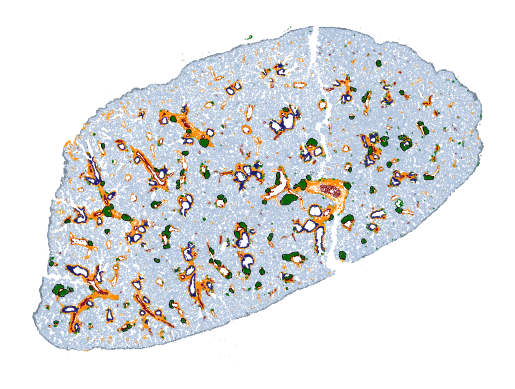

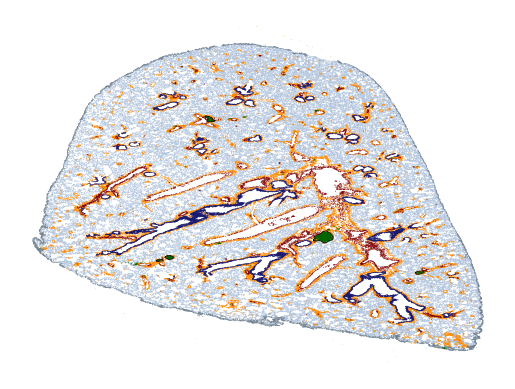

In [43]:
for sample_label in adata.obs['sample_label'].cat.categories:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]

    sc.pl.embedding(adata_sample, basis='spatial', color='zone_consol', 
                    palette=zone_consol_palette_mapped, 
                    # title=sample_label, 
                    title = '',
                    frameon=False, 
                    size=1, 
                    legend_loc = 'none',
                   show = False)

    # overlay poly - tls
    ax = plt.gca()
    poly = joblib.load(os.path.join(structures_dir, 'tls_poly_' + sample_label + '.pkl'))
    for p in poly.geoms:
            ax.plot(*p.exterior.xy, c='black', linewidth=.5, alpha = 1)
        
    plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_zone_spatial_tls_outlined.png"), dpi=300, bbox_inches='tight', transparent=True)
    

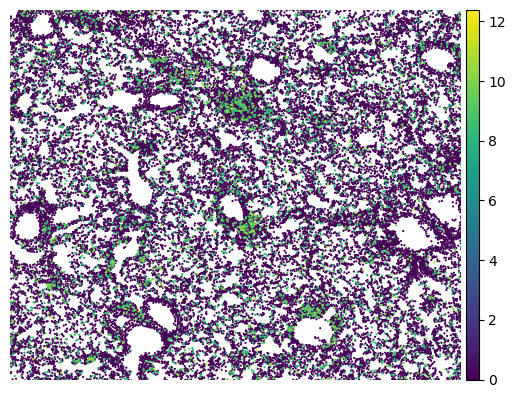

In [44]:
# for gene in ['Cd79a', 'Tcf7', 'Epcam']:
gene = 'Tcf7'
sample_label ='HDM_day3'
adata_sample = adata[adata.obs['sample_label']==sample_label, :]

sc.pl.embedding(adata_sample, basis='spatial', color=gene, 
                # title=sample_label, 
                title = '',
                frameon=False, 
                size=10, 
                legend_loc = 'none',
               show = False)

plt.xlim([3000, 5000])
plt.ylim([3000, 5000])
    
plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_{gene}_spatial_zoom.png"), dpi=300, bbox_inches='tight', transparent=True)
        

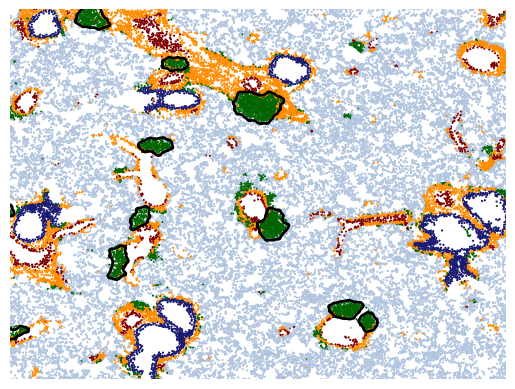

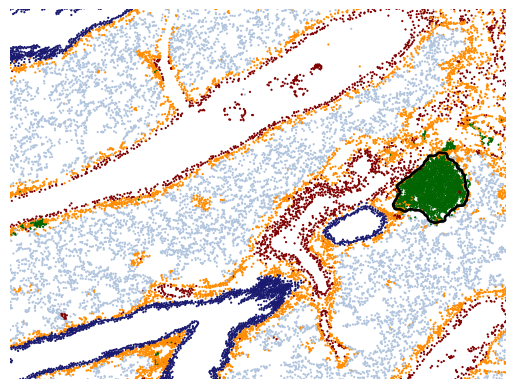

In [45]:
for sample_label in adata.obs['sample_label'].cat.categories:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]

    sc.pl.embedding(adata_sample, basis='spatial', color='zone_consol', 
                    palette=zone_consol_palette_mapped, 
                    # title=sample_label, 
                    title = '',
                    frameon=False, 
                    size=10, 
                    legend_loc = 'none',
                    show=False)

    # overlay poly - tls
    ax = plt.gca()
    poly = joblib.load(os.path.join(structures_dir, 'tls_poly_' + sample_label + '.pkl'))
    for p in poly.geoms:
            ax.plot(*p.exterior.xy, c='black', linewidth=2, alpha = 1)
        
    plt.xlim([3000, 5000])
    plt.ylim([3000, 5000])
    plt.savefig(os.path.join(plot_out_dir, f"{sample_label}_zone_spatial_zoom_tls_outline.png"), dpi=300, bbox_inches='tight', transparent=True)
    plt.show()

## CD4 plots
-  integrated CITE and Xenium labeled
-  bar plots of zone distribution

In [46]:
import matplotlib as mpl
mpl.rcParams['axes.titlesize'] = 28 

### Integrated CITE and Xenium labeled

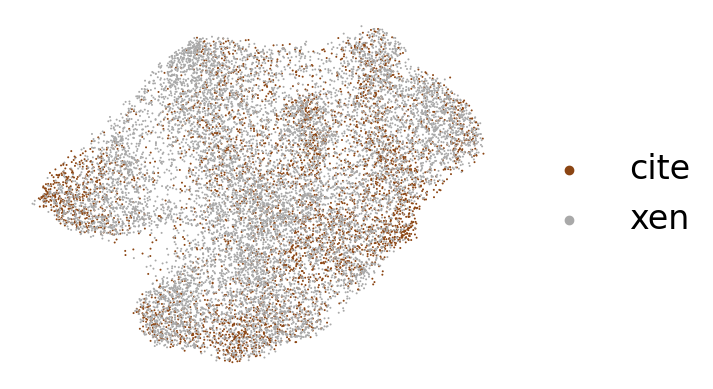

In [47]:
sc.pl.embedding(adata_int, basis = 'X_umap_int', color='modality', palette = ['saddlebrown', 'darkgray'], title = '', frameon=False, 
                legend_fontsize=24,
                show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_cd4_integrated_modality.pdf"), dpi=300, bbox_inches='tight', transparent=True)

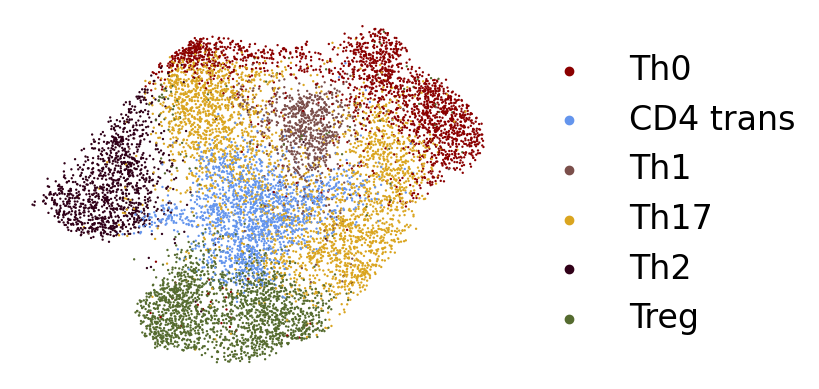

In [48]:
sc.pl.embedding( , basis = 'X_umap_int', color='label_fine', palette = celltype_palette_mapped, title = '', frameon=False, 
                legend_fontsize=24,
                show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_cd4_integrated_xenonly.pdf"), dpi=300, bbox_inches='tight', transparent=True)

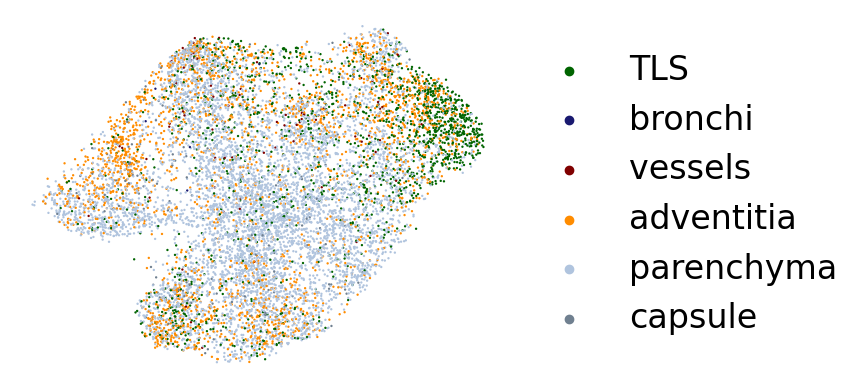

In [54]:
sc.pl.embedding(adata_cd4, basis = 'X_umap_int', color='zone_consol', palette = zone_consol_palette_mapped, title = '', frameon=False, 
                legend_fontsize=24,
                show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_cd4_integrated_zone_xenonly.pdf"), dpi=300, bbox_inches='tight', transparent=True)

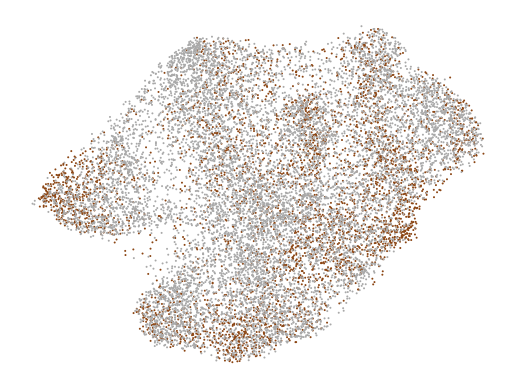

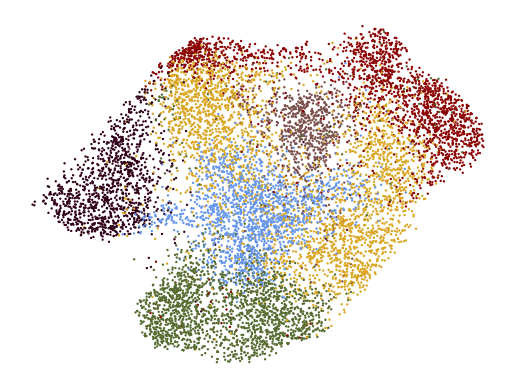

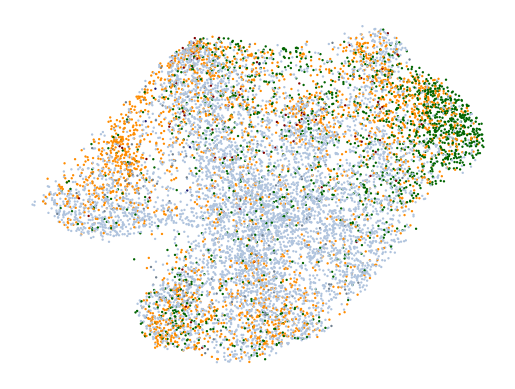

In [55]:
# generate the same plots with no legend 
sc.pl.embedding(adata_int, basis = 'X_umap_int', color='modality', palette = ['saddlebrown', 'darkgray'], title = '', frameon=False, 
                legend_loc='none',
                show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_cd4_integrated_modality_nolegend.pdf"), dpi=300, bbox_inches='tight', transparent=True)

sc.pl.embedding(adata_cd4, basis = 'X_umap_int', color='label_fine', palette = celltype_palette_mapped, title = '', frameon=False, 
                legend_loc='none',
                show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_cd4_integrated_xenonly_nolegend.pdf"), dpi=300, bbox_inches='tight', transparent=True)

sc.pl.embedding(adata_cd4, basis = 'X_umap_int', color='zone_consol', palette = zone_consol_palette_mapped, title = '', frameon=False, 
                legend_loc='none',
                show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_cd4_integrated_zone_xenonly_nolegend.pdf"), dpi=300, bbox_inches='tight', transparent=True)

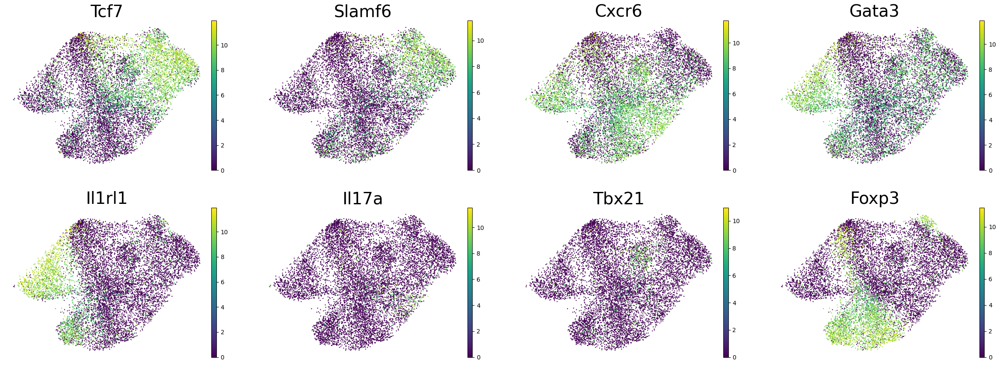

In [56]:
genes = ['Tcf7','Slamf6', 'Cxcr6', 'Gata3', 'Il1rl1', 'Il17a', 'Tbx21', 'Foxp3']
sc.pl.embedding(adata_cd4, basis = 'X_umap_int', color=genes, ncols = 4, frameon=False, show=False)
plt.savefig(os.path.join(plot_out_dir, "umap_cd4_integrated_genes_xenonly.png"), dpi=300, bbox_inches='tight', transparent=True)

### Plot CD4 / zone distributions

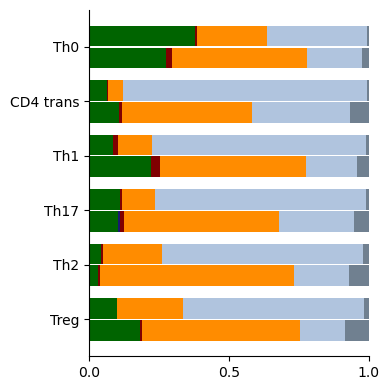

In [57]:
ax = pu.plot_fraction_stacked_bar_horizontal(
    adata_cd4,
    x_col = 'label_fine', sample_col = 'sample_label', stack_col = 'zone_consol', palette = zone_consol_palette_mapped, show_legend=False, figsize = (4,4))
plt.savefig(os.path.join(plot_out_dir, f"zone_frac_by_CD4_subset.pdf"), dpi=300, bbox_inches='tight', transparent=True)

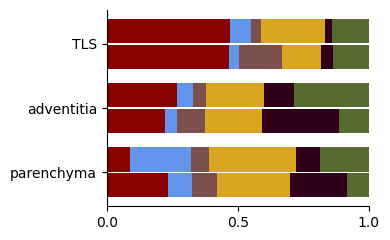

In [58]:
ax = pu.plot_fraction_stacked_bar_horizontal(
    adata_cd4[~adata_cd4.obs['zone_consol'].isin(['bronchi','vessels','capsule']), :],
    x_col = 'zone_consol', sample_col = 'sample_label', stack_col = 'label_fine', palette = celltype_palette_mapped, show_legend=False, figsize = (4,2.5))
plt.savefig(os.path.join(plot_out_dir, f"CD4_frac_by_zone.pdf"), dpi=300, bbox_inches='tight', transparent=True)

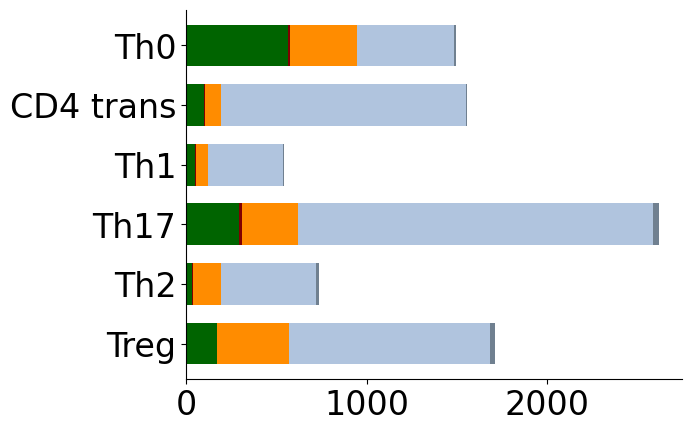

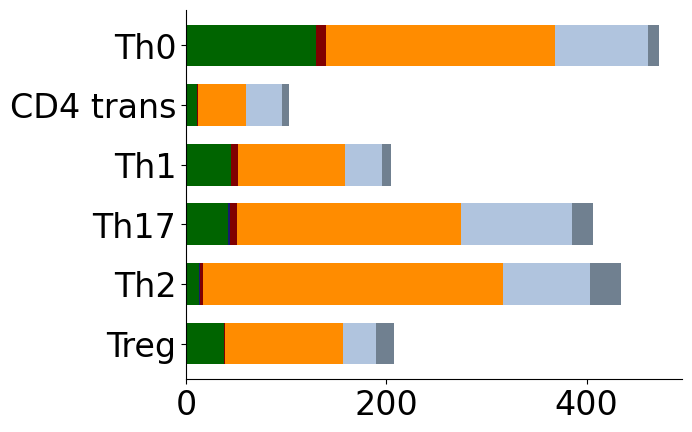

In [59]:
for sample_label in ['HDM_day3', 'HDM_day30']:
    adata_plot = adata_cd4[adata_cd4.obs['sample_label']==sample_label, :]
    
    zone_col = 'label_fine'
    label_col = 'zone_consol'
    
    ax1 = pu.zone_composition(adata_plot, label_col, zone_col,
                                remove_unlabeled = True, 
                           palette_map = zone_consol_palette_mapped,
                           plot_counts = True, 
                           zone_ncell_filter = 50,
                           horizontal=True
                          )
    ax1.tick_params(axis='x', labelsize=24)
    ax1.tick_params(axis='y', labelsize=24)
    ax1.set_title('')       
    ax1.set_xlabel('')    
    ax1.legend_.remove()
    # plt.savefig(os.path.join(plot_out_dir, f"zone_counts_by_CD4_subset_{sample_label}.png"), dpi=300, bbox_inches='tight', transparent=True)
    plt.savefig(os.path.join(plot_out_dir, f"zone_counts_by_CD4_subset_{sample_label}.pdf"), dpi=300, bbox_inches='tight', transparent=True)

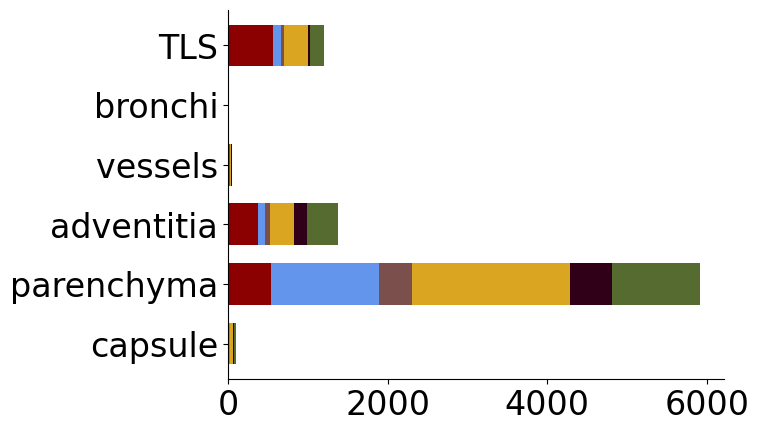

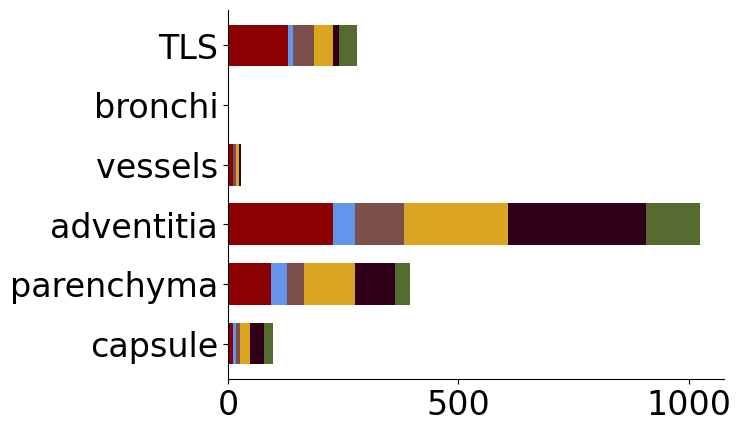

In [60]:
for sample_label in ['HDM_day3', 'HDM_day30']:
    adata_plot = adata_cd4[adata_cd4.obs['sample_label']==sample_label, :]
    
    zone_col = 'zone_consol'
    label_col = 'label_fine'
    
    ax1 = pu.zone_composition(adata_plot, label_col, zone_col,
                                remove_unlabeled = True, 
                           palette_map = celltype_palette_mapped,
                           plot_counts = True, 
                           zone_ncell_filter = False,
                           horizontal=True
                          )
    ax1.tick_params(axis='x', labelsize=24)
    ax1.tick_params(axis='y', labelsize=24)
    ax1.set_title('')       
    ax1.set_xlabel('')   
    ax1.legend_.remove()
    # plt.savefig(os.path.join(plot_out_dir, f"CD4_counts_by_zone_subset_{sample_label}.png"), dpi=300, bbox_inches='tight', transparent=True)
    plt.savefig(os.path.join(plot_out_dir, f"CD4_counts_by_zone_subset_{sample_label}.pdf"), dpi=300, bbox_inches='tight', transparent=True)

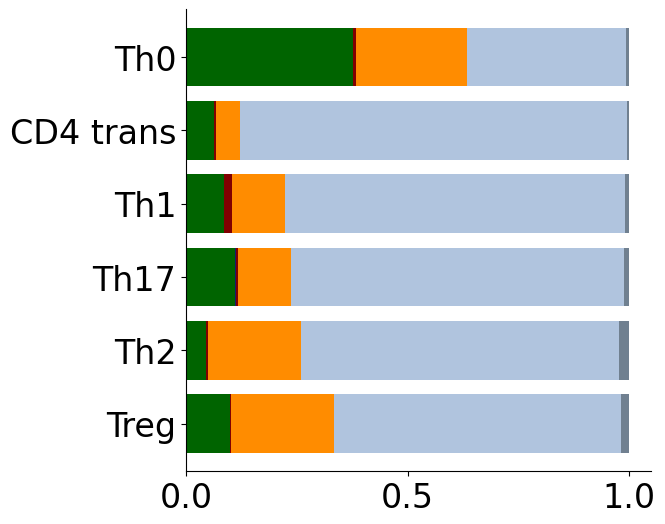

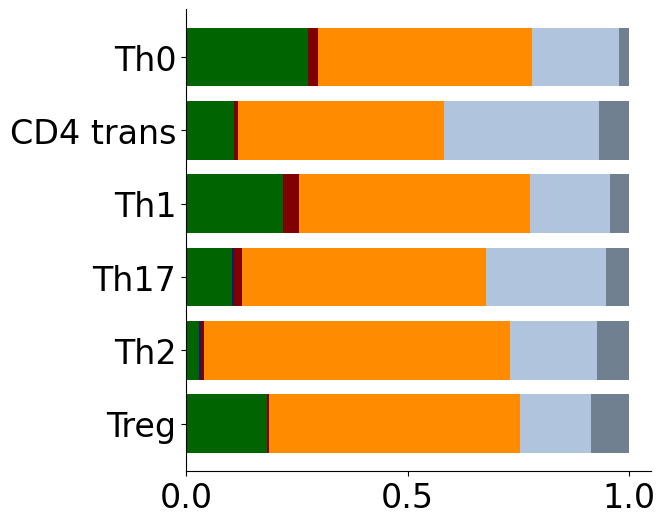

In [61]:
for sample_label in ['HDM_day3', 'HDM_day30']:
    adata_plot = adata_cd4[adata_cd4.obs['sample_label']==sample_label, :]
    
    zone_col = 'label_fine'
    label_col = 'zone_consol'
    
    ax1 = pu.zone_composition(adata_plot, label_col, zone_col,
                                remove_unlabeled = True, 
                           palette_map = zone_consol_palette_mapped,
                           plot_counts = False, 
                           zone_ncell_filter = 50,
                           horizontal=True, 
                           whitespace=0.8
                          )
    ax1.figure.set_size_inches(6, 6)
    ax1.tick_params(axis='x', labelsize=24)
    ax1.tick_params(axis='y', labelsize=24)
    ax1.set_title('')       
    ax1.set_xlabel('')    
    ax1.legend_.remove()
    # plt.savefig(os.path.join(plot_out_dir, f"zone_frac_by_CD4_subset_{sample_label}.png"), dpi=300, bbox_inches='tight', transparent=True)
    # plt.savefig(os.path.join(plot_out_dir, f"zone_frac_by_CD4_subset_{sample_label}.pdf"), dpi=300, bbox_inches='tight', transparent=True)

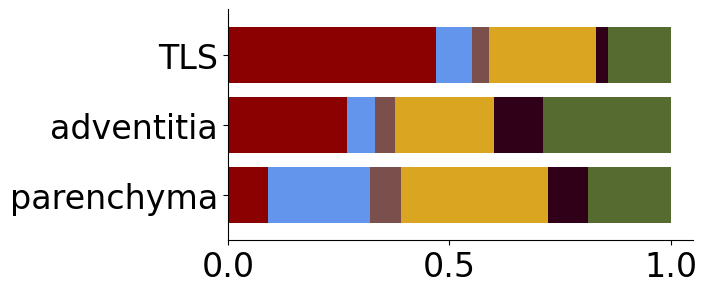

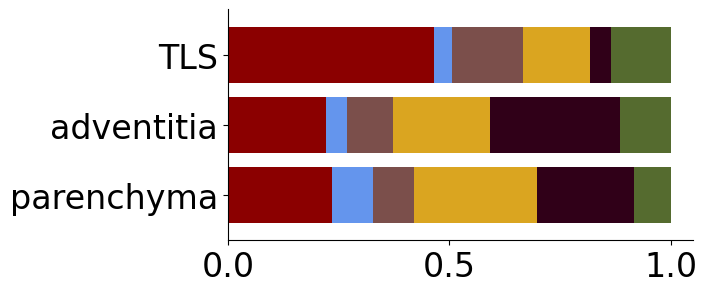

In [62]:
# Just show TLS, adventitia, and parenchyma for this 

for sample_label in ['HDM_day3', 'HDM_day30']:
    adata_plot = adata_cd4[adata_cd4.obs['sample_label']==sample_label, :]
    adata_plot = adata_plot[adata_plot.obs['zone_consol'].isin(['TLS', 'TLS-small', 'adventitia', 'parenchyma']), :]
    
    zone_col = 'zone_consol'
    label_col = 'label_fine'
    
    ax1 = pu.zone_composition(adata_plot, label_col, zone_col,
                                remove_unlabeled = True, 
                           palette_map = celltype_palette_mapped,
                           plot_counts = False, 
                           zone_ncell_filter = None,
                           horizontal=True,
                           whitespace=0.8
                          )
    ax1.figure.set_size_inches(6, 3)
    ax1.tick_params(axis='x', labelsize=24)
    ax1.tick_params(axis='y', labelsize=24)
    ax1.set_title('')       
    ax1.set_xlabel('')  
    ax1.legend_.remove()
    # plt.savefig(os.path.join(plot_out_dir, f"CD4_frac_by_zone_subset_{sample_label}.png"), dpi=300, bbox_inches='tight', transparent=True)
    plt.savefig(os.path.join(plot_out_dir, f"CD4_frac_by_zone_subset_{sample_label}.pdf"), dpi=300, bbox_inches='tight', transparent=True)

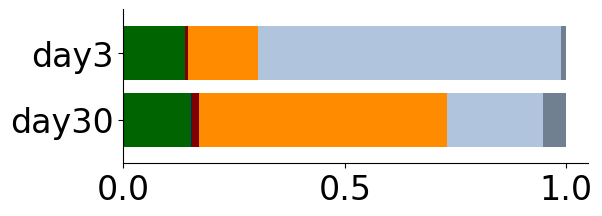

In [63]:
zone_col = 'timepoint'
label_col = 'zone_consol'

ax1 = pu.zone_composition(adata_cd4, label_col, zone_col,
                            remove_unlabeled = True, 
                       palette_map = zone_consol_palette_mapped,
                       plot_counts = False, 
                       zone_ncell_filter = 50,
                       horizontal=True,
                       whitespace=0.8
                      )

ax1.figure.set_size_inches(6, 2)
ax1.tick_params(axis='x', labelsize=24)
ax1.tick_params(axis='y', labelsize=24)
ax1.set_title('')       
ax1.set_xlabel('')   
ax1.legend_.remove()
# plt.savefig(os.path.join(plot_out_dir, f"CD4_timepoint_zones.png"), dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(os.path.join(plot_out_dir, f"CD4_timepoint_zones.pdf"), dpi=300, bbox_inches='tight', transparent=True)

# ax1.spines['bottom'].set_linewidth(1)  # x-axis
# ax1.spines['left'].set_linewidth(1)    # y-axis

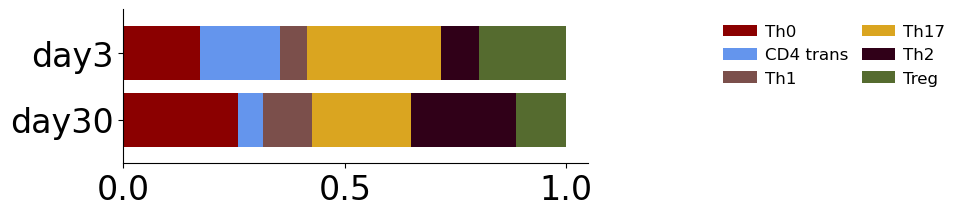

In [64]:
zone_col = 'timepoint'
label_col = 'label_fine'

ax1 = pu.zone_composition(adata_cd4, label_col, zone_col,
                            remove_unlabeled = True, 
                       palette_map = celltype_palette_mapped,
                       plot_counts = False, 
                       zone_ncell_filter = 50,
                       horizontal=True,
                       whitespace=0.8
                      )

ax1.figure.set_size_inches(6, 2)
ax1.tick_params(axis='x', labelsize=24)
ax1.tick_params(axis='y', labelsize=24)
ax1.set_title('')       
ax1.set_xlabel('')   
# ax1.legend_.remove()
# plt.savefig(os.path.join(plot_out_dir, f"CD4_timepoint_zones.png"), dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(os.path.join(plot_out_dir, f"CD4_timepoint_zones.pdf"), dpi=300, bbox_inches='tight', transparent=True)

# ax1.spines['bottom'].set_linewidth(1)  # x-axis
# ax1.spines['left'].set_linewidth(1)    # y-axis

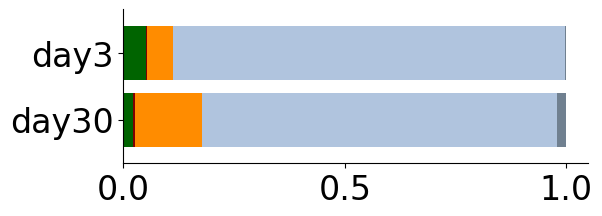

In [65]:
zone_col = 'timepoint'
label_col = 'zone_consol'

ax1 = pu.zone_composition(adata[adata.obs['label_medium']=='CD4 naive', :], 
                       label_col, zone_col,
                            remove_unlabeled = True, 
                       palette_map = zone_consol_palette_mapped,
                       plot_counts = False, 
                       zone_ncell_filter = 50,
                       horizontal=True,
                       whitespace=0.8
                      )

ax1.figure.set_size_inches(6, 2)
ax1.tick_params(axis='x', labelsize=24)
ax1.tick_params(axis='y', labelsize=24)
ax1.set_title('')       
ax1.set_xlabel('')   
ax1.legend_.remove()
plt.savefig(os.path.join(plot_out_dir, f"CD4_timepoint_zones_cd4naive.pdf"), dpi=300, bbox_inches='tight', transparent=True)

# ax1.spines['bottom'].set_linewidth(1)  # x-axis
# ax1.spines['left'].set_linewidth(1)    # y-axis

### Plot tissue are per zone (all cells) at day 3 and day 30

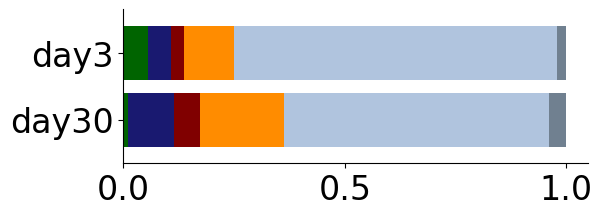

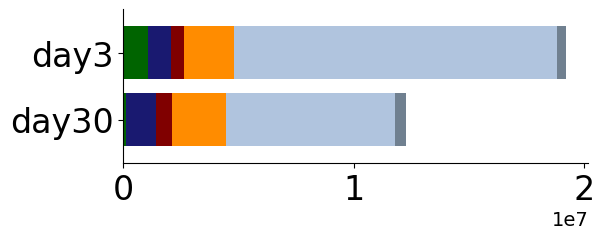

In [66]:
# Make sure the relevant columns exist
df = adata.obs[['cell_area', 'zone_consol', 'timepoint']].copy()

# Group and sum cell areas
area_summary = (
    df.groupby(['timepoint', 'zone_consol'])['cell_area']
    .sum()
    .reset_index()
    .pivot(index='timepoint', columns='zone_consol', values='cell_area')
    .fillna(0)  # fill any missing zone/timepoint with 0
)

# fraction
row_sums = area_summary.sum(axis=1)
area_summary_frac = area_summary.div(row_sums, axis=0)

# reorder rows
area_summary = area_summary.iloc[::-1]
area_summary_frac = area_summary_frac.iloc[::-1]

# Plot
ax = area_summary_frac.plot(
    kind='barh',
    stacked=True,
    figsize=(6,2),
    color=zone_consol_palette_mapped,
    width = 0.8
)

# Styling
sns.despine()
ax.tick_params(axis='x', labelsize=24)
ax.tick_params(axis='y', labelsize=24)
ax.set_title('')  
ax.set_xlabel('')  
ax.set_ylabel('')  
ax.legend_.remove()
# plt.savefig(os.path.join(plot_out_dir, f"zone_cell_area_fraction.png"), dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(os.path.join(plot_out_dir, f"zone_cell_area_fraction.pdf"), dpi=300, bbox_inches='tight', transparent=True)

# Plot
ax = area_summary.plot(
    kind='barh',
    stacked=True,
    figsize=(6,2),
    color=zone_consol_palette_mapped,
    width = 0.8
)

# Styling
sns.despine()
ax.tick_params(axis='x', labelsize=24)
ax.tick_params(axis='y', labelsize=24)
ax.set_title('')  
ax.set_xlabel('')  
ax.set_ylabel('')  
ax.legend_.remove()
# plt.savefig(os.path.join(plot_out_dir, f"zone_cell_area_counts.png"), dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(os.path.join(plot_out_dir, f"zone_cell_area_counts.pdf"), dpi=300, bbox_inches='tight', transparent=True)

## Plot CD4 density in zones by zone area

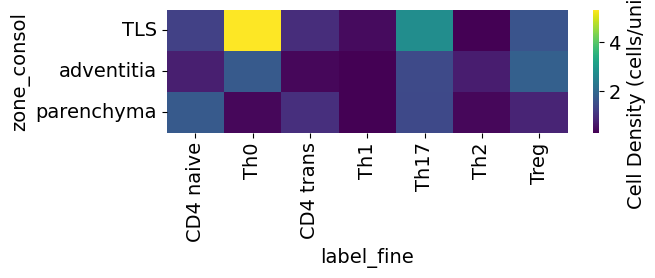

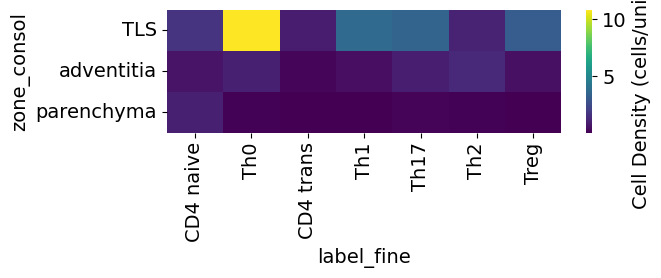

In [67]:
zone_col = 'zone_consol'
label_col = 'label_fine'

density_dfs = []
for sample_label in ['HDM_day3', 'HDM_day30']:
    adata_sample = adata[adata.obs['sample_label']==sample_label, :]
    adata_sample = adata_sample[adata_sample.obs['zone_consol'].isin(['TLS', 'adventitia', 'parenchyma']), :]
    # adata_cd4 = adata_sample[adata_sample.obs['label_medium']=='CD4 act', :]
    adata_cd4 = adata_sample[adata_sample.obs['label_coarse']=='CD4 T cell', :]
    
    
    
    # calculate counts of CD4 subsets in each zone
    counts_df_cd4 = adata_cd4.obs.groupby([zone_col, label_col]).size().reset_index(name='count')
    counts_df_cd4 = pd.pivot_table(
        counts_df_cd4, values='count', index=zone_col, columns=label_col, fill_value=0
    )
    
    # now calculate total area covered by each zone
    df = adata_sample.obs[['cell_area', 'zone_consol']].copy()
    area_summary = (
        df.groupby([zone_col])['cell_area']
        .sum())
    area_summary = area_summary/10000 # divide by 10000 to make the area values here 10000 um^2
    
    cd4_density = counts_df_cd4.div(area_summary, axis=0) 

    # plt.figure(figsize=(6, 3))
    plt.figure(figsize=(7, 3))
    sns.heatmap(cd4_density, cmap='viridis', cbar_kws={'label': 'Cell Density (cells/unit area)'})
    plt.tight_layout()
    # plt.show()
    # plt.savefig(os.path.join(plot_out_dir, f"CD4_zone_density_{sample_label}.pdf"), dpi=300, bbox_inches='tight', transparent=True)
    plt.savefig(os.path.join(plot_out_dir, f"CD4_zone_density_{sample_label}_include_naive.pdf"), dpi=300, bbox_inches='tight', transparent=True)

    
    cd4_density['sample'] = sample_label
    density_dfs.append(cd4_density)
    

density_df_combined = pd.concat(density_dfs)

In [69]:
import session_info
print('active conda environment: ', os.path.basename(sys.prefix))
session_info.show(excludes=['google3'])

active conda environment:  space2
